# Examples of consumption time series manipulation
### Table of Contents

* [1. Thermal sensitivity of consumption](#Sec1:thermal)
    * [1.1. Definition](#def)
    * [1.2. Functions to estimate  thermosensitivity and decompose consumption](#2functions)
    * [1.3. Functions to play with thermosensitivity of consumption and resimulate](#3functionsII)
* [2. Electric Vehicle consumption](#Sec3:Vehicle)
* [3. Sector by sector temporal model of consumption](#Sec4:sector)

This notebook gives a detailed explanation of the code contained in Consumption_TS_manipulation_examples.py.

In this notebook, you will manipulate temperature time series,
together with models of the thermal sensitivity of consumption.

In the end you will learn how to:
* estimate thermal sensitivity given time series of consumption and temperature
* decompose a consumption into two parts. The first one will not be correlated with temperature and the other one will depend linearly on cold temperatures
* remove the effect of temperature from year "x" in a consumption time series and apply the temperature from year "y".
* use a thermal sensitive consumption model to model electric car consumption

TODO : add something about sectorial decomposition of consumption

In [5]:
import os
InputFolder='Data/'

#region importation of modules
import numpy as np
import pandas as pd
import seaborn as sns # you might have to isntall seaborn yourself : conda install seaborn
import csv
import datetime
import copy
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from sklearn import linear_model

from functions.f_consumptionModels import * #Il faut préciser le chemin où vous avez sauvegardé les données csv
from functions.f_graphicalTools import * #Il faut préciser le chemin où vous avez sauvegardé les données csv
#endregion


## 1. Thermal sensitivity of consumption <a class="anchor" id="Sec1:thermal"></a>
### 1.1. Definition <a class="anchor" id="def"></a>
As an introduction, french speakers can read [my post](https://www.energy-alternatives.eu/2019/05/24/variabilite-de-la-consommation-electrique-et-thermo-sensibilite.html) (contribution for translation of this site's posts are welcome) on the subject.

You can observe how consumption depends upon temperature for year 2012.
Below a threshold temperature, here around 15 degres,
the relation between consumption and temperature is linear.
The coefficient of the linear regression is,
by definition, what we call the thermal sensitivity.

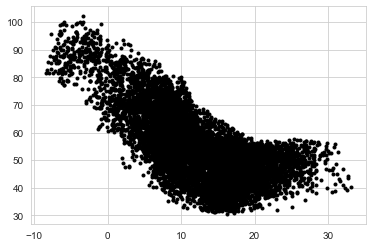

In [6]:
#region  Load and visualize consumption
ConsoTempe_df=pd.read_csv(InputFolder+'ConsumptionTemperature_1996TO2019_FR.csv',parse_dates=['Date']).set_index(["Date"])
year = 2012
ConsoTempeYear_df=ConsoTempe_df.loc[str(year)]
hour = 19
TemperatureThreshold = 15
plt.plot(ConsoTempeYear_df['Temperature'],ConsoTempeYear_df['Consumption']/1000, '.', color='black');
plt.show()
#endregion


### 1.2. Functions to estimate  thermosensitivity and decompose consumption <a class="anchor" id="2functions"></a>

Formally, the preceding linear regression is given by the following formula:

$$ C_t = C^{NT}_t+\rho_{h(t)}(T_t-T_0)_+$$

where $T_0$ is the threshold temperature, $(x)_+$ is $x$ for any non negative $x$ and zero otherwise,
$\rho_{h(t)}$ is the thermal sensitivity for hour $h$ (if it depends upon the hour of the day)
$C^{NT}_t$ is the part of the consumption that is not sensitive to the temperature.
It is obtained as the residuals of the linear regression for temperatures
lower than $T_0$ and is the consumption itself otherwise.

In module functions.functions_decompose_thermosensibilite, we have implemented
a function to estimate the different elements in the preceding equation, given consumption, temperature and other parameters (such as $T_0$).
Check the file functions_decompose_thermosensibilite.py to understand how this works.

In [7]:
#region  Thermal sensitivity estimation, consumption decomposition and visualisation
#select dates to do the linear regression
#ConsoTempeYear_df.index.get_level_values("Date").to_series().dt.hour
indexHeatingHour = (ConsoTempeYear_df['Temperature'] <= TemperatureThreshold) &\
                    (ConsoTempeYear_df.index.to_series().dt.hour == hour)
ConsoHeatingHour= ConsoTempeYear_df[indexHeatingHour]
lr=linear_model.LinearRegression().fit(ConsoHeatingHour[['Temperature']],
                                       ConsoHeatingHour['Consumption'])
lr.coef_[0]

#Generic function Thermal sensitivity estimation
(ConsoTempeYear_decomposed_df,Thermosensibilite)=Decomposeconso(ConsoTempeYear_df,TemperatureThreshold=TemperatureThreshold)
#ConsoTempeYear_decomposed_df=ConsoTempeYear_decomposed_df.rename(columns={'NTS_C':'Conso non thermosensible', "TS_C": 'conso thermosensible'})
fig=MyStackedPlotly(y_df=ConsoTempeYear_decomposed_df[["NTS_C","TS_C"]],
                    Names=['Conso non thermosensible','conso thermosensible'])
fig=fig.update_layout(title_text="Consommation (MWh)", xaxis_title="Date")
#plotly.offline.plot(fig, filename='file.html') ## offline
fig.show()
#endregion

### 1.3. Functions to play with thermosensitivity of consumption and resimulate <a class="anchor" id="3functionsII"></a>

You can do other interesting things. For example, you can redecompose the electric consumption of the year X to thermosensitive and no-thermosensitive parts from the thermosensitivity of the year X and the temperatures of the year Y. It's very useful to compare the years.

In [8]:
#region Thermal sensitivity model to change meteo
## change meteo year
## example for year 2012
newyear=2012
NewConsoTempeYear_df = ConsoTempe_df.loc[str(newyear)]
(ConsoTempeYear_decomposed_df,Thermosensibilite)=Decomposeconso(NewConsoTempeYear_df,TemperatureThreshold=TemperatureThreshold)

NewConsoTempeYear_decomposed_df=Recompose(ConsoTempeYear_decomposed_df,Thermosensibilite,
                                          Newdata_df=NewConsoTempeYear_df,
                                          TemperatureThreshold=TemperatureThreshold)
### loop over years
fig = go.Figure()
TMP=ConsoTempeYear_decomposed_df.copy()
TMP = TMP.reset_index().drop(columns="Date").assign(Date=range(1, len(TMP) + 1)).set_index(["Date"])
fig = fig.add_trace(
    go.Scatter(x=TMP.index,y=ConsoTempeYear_decomposed_df['Consumption'],line=dict(color="#000000"),name="original"))
for newyear in range(2000,2012):
    NewConsoTempeYear_df = ConsoTempe_df.loc[str(newyear)]
    ConsoSepareeNew_df=Recompose(ConsoTempeYear_decomposed_df,Thermosensibilite,
                                 Newdata_df=NewConsoTempeYear_df,
                                 TemperatureThreshold=TemperatureThreshold)
    ConsoSepareeNew_df = ConsoSepareeNew_df.reset_index().drop(columns="Date").assign(
        Date=range(1, len(ConsoSepareeNew_df) + 1)).set_index(["Date"])

    fig.add_trace(go.Scatter(x=ConsoSepareeNew_df.index,
                             y=ConsoSepareeNew_df['Consumption'],
                             line=dict(color="#9CA2A8",width=1),
                             name=newyear))

fig.show()
#endregion

In addition, with the same function Recompose to that you can also redecompose the electric consumption of the year X to thermosensitive and no-thermosensitive parts from a new table of thermosensitivity.

In [10]:
#region Thermal sensitivity model to change thermal sensitivity
## change thermal sensitivity
NewThermosensibilite={}
for key in Thermosensibilite:    NewThermosensibilite[key]=1/3 * Thermosensibilite[key]
NewConsoTempeYear_decomposed_df=Recompose(ConsoTempeYear_decomposed_df,NewThermosensibilite,
                                          TemperatureThreshold=TemperatureThreshold)
fig = go.Figure()
fig.add_trace(go.Scatter(x=ConsoTempeYear_decomposed_df.index,
                         y=ConsoTempeYear_decomposed_df['Consumption'],
                         line=dict(color="#000000"),name="original"))
fig.add_trace(go.Scatter(x=NewConsoTempeYear_decomposed_df.index,
                             y=NewConsoTempeYear_decomposed_df['Consumption'],
                             line=dict(color="#9CA2A8",width=1),
                             name=newyear))
#plotly.offline.plot(fig, filename='file.html') ## offline
fig.show()
#endregion


Now, you know everything about thermosensitivity and you can use theses functions whenever you want in the TP to cast light on interesting values and draw smart conclusions :)


## 2. Electric Vehicle consumption <a class="anchor" id="Sec3:Vehicle"></a>

In [11]:
#region Electric Vehicle

VEProfile_df=pd.read_csv(InputFolder+'EVModel.csv', sep=';')
year=2012
NewConsoTempeYear_df = ConsoTempe_df[str(year)]
EV_Consumption_df=Profile2Consumption(Profile_df=VEProfile_df,Temperature_df = NewConsoTempeYear_df[['Temperature']])
fig=MyStackedPlotly(y_df=EV_Consumption_df[["NTS_C","TS_C"]],
                    Names=['Conso VE non thermosensible','conso VE thermosensible'])
fig=fig.update_layout(title_text="Consommation (MWh)", xaxis_title="Date")
#plotly.offline.plot(fig, filename='file.html') ## offline
fig.show()
#endregion


/var/folders/zt/7cz1y9md79l_h08bbqymt4w9z8xlw7/T/ipykernel_66562/3409806356.py:5: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



## 3. Sector by sector temporal model of consumption <a class="anchor" id="Sec4:sector"></a>

TODO : if you want to contribute, you can add models in functions.f_consumptionModels.py and explanations here and in input-Consumption.py

In [12]:
#region consumption decomposition
ConsoTempe_df=pd.read_csv(InputFolder+'ConsumptionTemperature_1996TO2019_FR.csv',parse_dates=['Date']).set_index(["Date"])
year = 2012
Profile_df=pd.read_csv(InputFolder+"ConsumptionDetailedProfiles.csv").set_index(["Mois", "heures",'Nature', 'type', 'UsagesGroupe', 'UsageDetail', "WeekDay"])
Profile_df_merged=ComplexProfile2Consumption(Profile_df,ConsoTempe_df[str(year)])

Profile_df_merged_spread = Profile_df_merged.groupby(["Date","UsagesGroupe"]).sum().reset_index(). \
    drop(columns=["Temperature"]). \
    pivot(index="Date", columns=["UsagesGroupe"], values='Conso');
Profile_df_merged_spread
fig = MyStackedPlotly(y_df=Profile_df_merged_spread)
#plotly.offline.plot(fig, filename='file.html')  ## offline
fig.show()
#endregion

<ipython-input-12-3f3f60768c50>:5: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



ValueError: 
    Invalid value of type 'builtins.tuple' received for the 'name' property of scatter
        Received value: ('Autre', 'Agriculture')

    The 'name' property is a string and must be specified as:
      - A string
      - A number that will be converted to a string